In [1]:
import xarray as xr
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

path_data_DCO = "/Users/eresther/Documents/Work/PhD/Codes/Data_DCO"
path_data_PSTH = "/Users/eresther/Documents/Work/PhD/Codes/Data_PSTH"
path_save = "/Users/eresther/Documents/Work/multitask-context-dependent-behavior/notebooks/data"
path_figures = "/Users/eresther/Documents/Work/multitask-context-dependent-behavior/notebooks/figs"

AREAS = ["A1", "dPEG", "VPr", "PFC"]
TASKS = ["PTD", "CLK"]
CTXS = ["a", "p"]
STIMS = ["R", "T"] # exclude N for most plots
TORCSofTASKS = {"PTD": ["R"], "CLK": ["N"]}
STIMSofTASKS = {"PTD": ["R", "T"], "CLK": ["R", "T", "N"]}
WDWS = ["stim", "post"]
POPULATIONS = ["all", "low", "high"]

WDWS_FULL = {"stim": "stimulus", "post": "post-stimulus"}
CTXS_FULL = {"a": "active", "p": "passive"}

T_BOUNDS = {"stim": [0, 0.3], "post": [0.8, 1.1]}
t_onset = 0
t_offset = 0.75

training = True

# TODO

- [ ] Fixed decoders also for subpopukations
- [ ] Compare with decoder in passive
- [ ] Send figures

# Import Data

In [2]:
# Weights across time
W = {area: None for area in AREAS}
for area in AREAS:
    W[area] = xr.open_dataarray(f"{path_data_DCO}/Wt_{training}_{area}.nc")

# Active-specific Weights
Wact = {area: None for area in AREAS}
for area in AREAS:
    Wact[area] = xr.open_dataarray(f"{path_data_DCO}/Wact_{training}_{area}.nc")

# Z scored activities
X = {area: None for area in AREAS}
for area in AREAS:
    X[area] = xr.open_dataarray(f"{path_data_PSTH}/Z_{training}_{area}_valid.nc")

In [3]:
# Import U_low and U_high as numpy arrays
U = {'low': {area: np.load(f"{path_save}/U_low_{area}.npy") for area in AREAS},
     'high': {area: np.load(f"{path_save}/U_high_{area}.npy") for area in AREAS}}

print(U["low"]["A1"].shape)

(26,)


In [4]:
# Activities
X['A1']

<xarray.DataArray 'Z-scores' (units: 26, time: 38, trials: 2073)> Size: 16MB
[2048124 values with dtype=float64]
Coordinates:
  * trials   (trials) int64 17kB 0 1 3 10 14 16 ... 1603 1679 1680 1686 1689
    task     (trials) <U3 25kB ...
    ctx      (trials) <U1 8kB ...
    stim     (trials) <U1 8kB ...
    train_0  (trials) bool 2kB ...
    test_0   (trials) bool 2kB ...
    train_1  (trials) bool 2kB ...
    test_1   (trials) bool 2kB ...
    train_2  (trials) bool 2kB ...
    test_2   (trials) bool 2kB ...
  * units    (units) <U10 1kB 'lem046d-j1' 'avo047a-u1' ... 'lem045c-p1'
  * time     (time) float64 304B -0.35 -0.3 -0.25 -0.2 ... 1.35 1.4 1.45 1.5
Attributes:
    area:      A1
    training:  1
    errors:    0
    k:         3

In [5]:
# Decoders
print(Wact['VPr']['set_sizes'].values)
Wact['VPr']

[24 24 24 24 24]


<xarray.DataArray 'Residual-specific decoders' (units: 127, time: 38,
                                                decoders: 4, folds: 3,
                                                models: 101, batches: 5)> Size: 234MB
[29245560 values with dtype=float64]
Coordinates: (12/14)
  * units       (units) <U12 6kB 'avo109b-a1' 'lemon082b-d1' ... 'avo070a-c1'
  * time        (time) float64 304B -0.35 -0.3 -0.25 -0.2 ... 1.35 1.4 1.45 1.5
  * decoders    (decoders) <U15 240B 'GoPTD-NoGoPTD-p' ... 'GoCLK-NoGoCLK-a'
  * folds       (folds) <U7 84B 'train_0' 'train_1' 'train_2'
  * models      (models) <U7 3kB 'true' 'perm_0' ... 'perm_98' 'perm_99'
  * batches     (batches) int64 40B 0 1 2 3 4
    ...          ...
    task1       (decoders) <U3 48B ...
    ctx1        (decoders) <U1 16B ...
    stim1       (decoders) <U1 16B ...
    task0       (decoders) <U3 48B ...
    ctx0        (decoders) <U1 16B ...
    stim0       (decoders) <U1 16B ...
Attributes:
    area:      VPr
    training:  1
    errors:    0
    k:         3

# Preprocess Data

In [6]:
# Define useful variables
print(Wact['A1']['set_sizes'].values)
time_axis = Wact['A1']['time'].values
ntpts = len(time_axis)
nfolds = Wact['A1'].attrs['k']
set_size = 24

def get_nbatches(area):
    return len(Wact[area]['batches'].values)

print(ntpts, nfolds, get_nbatches("A1"))


[24 24]
38 3 2


## Time-varying decoders

Keep true models, for each area, task and context-specific decoders


In [7]:
W_t = {
        area: {
            task: {
                ctx:
                    Wact[area].sel(decoders=f'Go{task}-NoGo{task}-{ctx}', models='true')
                for ctx in CTXS
            } for task in TASKS
        } for area in AREAS
}

W_t['A1']['PTD']['a']

<xarray.DataArray 'Residual-specific decoders' (units: 26, time: 38, folds: 3,
                                                batches: 2)> Size: 47kB
[5928 values with dtype=float64]
Coordinates: (12/14)
  * units       (units) <U10 1kB 'lem046d-j1' 'avo047a-u1' ... 'lem045c-p1'
  * time        (time) float64 304B -0.35 -0.3 -0.25 -0.2 ... 1.35 1.4 1.45 1.5
    decoders    <U15 60B 'GoPTD-NoGoPTD-a'
  * folds       (folds) <U7 84B 'train_0' 'train_1' 'train_2'
    models      <U7 28B 'true'
  * batches     (batches) int64 16B 0 1
    ...          ...
    task1       <U3 12B ...
    ctx1        <U1 4B ...
    stim1       <U1 4B ...
    task0       <U3 12B ...
    ctx0        <U1 4B ...
    stim0       <U1 4B ...
Attributes:
    area:      A1
    training:  1
    errors:    0
    k:         3

## Fixed decoder

Keep a single decoder by averaging the decoders during a time window.


In [8]:
W_fixed = {
    area: {
        task: {
            ctx: {
                wdw:
                    np.full((nfolds, get_nbatches(area)), fill_value=None)
                for wdw in WDWS
            } for ctx in CTXS
        } for task in TASKS
    } for area in AREAS
}


for area in AREAS:
    for task in TASKS:
        for ctx in CTXS:
            for wdw in WDWS:
                t_bounds = T_BOUNDS[wdw]
                print(wdw, t_bounds)
                for f in range(nfolds):
                    for b in range(get_nbatches(area)):
                        print(f"*** Area: {area}, Task: {task}, Context: {ctx}, Fold: {f}, Batch: {b}, Window: {wdw} ***")
                        # Extract the decoders in the time window
                        w = W_t[area][task][ctx].sel(folds=f'train_{f}', batches=b, time=slice(t_bounds[0], t_bounds[1])).values # (nunits, ntpts)
                        # Average
                        W_fixed[area][task][ctx][wdw][f, b] = np.nanmean(w, axis=1) # (nunits,)

stim [0, 0.3]
*** Area: A1, Task: PTD, Context: a, Fold: 0, Batch: 0, Window: stim ***
*** Area: A1, Task: PTD, Context: a, Fold: 0, Batch: 1, Window: stim ***
*** Area: A1, Task: PTD, Context: a, Fold: 1, Batch: 0, Window: stim ***
*** Area: A1, Task: PTD, Context: a, Fold: 1, Batch: 1, Window: stim ***
*** Area: A1, Task: PTD, Context: a, Fold: 2, Batch: 0, Window: stim ***
*** Area: A1, Task: PTD, Context: a, Fold: 2, Batch: 1, Window: stim ***
post [0.8, 1.1]
*** Area: A1, Task: PTD, Context: a, Fold: 0, Batch: 0, Window: post ***
*** Area: A1, Task: PTD, Context: a, Fold: 0, Batch: 1, Window: post ***
*** Area: A1, Task: PTD, Context: a, Fold: 1, Batch: 0, Window: post ***
*** Area: A1, Task: PTD, Context: a, Fold: 1, Batch: 1, Window: post ***
*** Area: A1, Task: PTD, Context: a, Fold: 2, Batch: 0, Window: post ***
*** Area: A1, Task: PTD, Context: a, Fold: 2, Batch: 1, Window: post ***
stim [0, 0.3]
*** Area: A1, Task: PTD, Context: p, Fold: 0, Batch: 0, Window: stim ***
*** Are

/var/folders/ps/dsyvdxxn5tj95j6t61_ywntm0000gn/T/ipykernel_4756/144491131.py:26: RuntimeWarning: Mean of empty slice
  W_fixed[area][task][ctx][wdw][f, b] = np.nanmean(w, axis=1) # (nunits,)


*** Area: VPr, Task: PTD, Context: a, Fold: 2, Batch: 1, Window: stim ***
*** Area: VPr, Task: PTD, Context: a, Fold: 2, Batch: 2, Window: stim ***
*** Area: VPr, Task: PTD, Context: a, Fold: 2, Batch: 3, Window: stim ***
*** Area: VPr, Task: PTD, Context: a, Fold: 2, Batch: 4, Window: stim ***
post [0.8, 1.1]
*** Area: VPr, Task: PTD, Context: a, Fold: 0, Batch: 0, Window: post ***
*** Area: VPr, Task: PTD, Context: a, Fold: 0, Batch: 1, Window: post ***
*** Area: VPr, Task: PTD, Context: a, Fold: 0, Batch: 2, Window: post ***
*** Area: VPr, Task: PTD, Context: a, Fold: 0, Batch: 3, Window: post ***
*** Area: VPr, Task: PTD, Context: a, Fold: 0, Batch: 4, Window: post ***
*** Area: VPr, Task: PTD, Context: a, Fold: 1, Batch: 0, Window: post ***
*** Area: VPr, Task: PTD, Context: a, Fold: 1, Batch: 1, Window: post ***
*** Area: VPr, Task: PTD, Context: a, Fold: 1, Batch: 2, Window: post ***
*** Area: VPr, Task: PTD, Context: a, Fold: 1, Batch: 3, Window: post ***
*** Area: VPr, Task: P

## Projections

Compute projections of the activity in each condition onto the decoders.
Consider all neurons or filter by population.

In [10]:
P = {
    pop: {
        area: {
            # conditions where decoders were fitted
            (task_dec, ctx_dec, wdw): {
                # conditions where activity is collected
                (task_act, ctx_act, stim): np.full((ntpts, nfolds, get_nbatches(area)), fill_value=np.nan)
                for task_act in TASKS for ctx_act in CTXS for stim in STIMSofTASKS[task_act]
            } for task_dec in TASKS for ctx_dec in CTXS for wdw in WDWS
        } for area in AREAS
    } for pop in POPULATIONS
}

STD = {
    pop: {
        area: {
            (task_dec, ctx_dec, wdw): {
                (task_act, ctx_act, stim): np.full((ntpts, nfolds, get_nbatches(area)), fill_value=np.nan)
                for task_act in TASKS for ctx_act in CTXS for stim in STIMSofTASKS[task_act]
            } for task_dec in TASKS for ctx_dec in CTXS for wdw in WDWS
        } for area in AREAS
    } for pop in POPULATIONS
}

SEM = {
    pop: {
        area: {
            (task_dec, ctx_dec, wdw): {
                (task_act, ctx_act, stim): np.full((ntpts, nfolds, get_nbatches(area)), fill_value=np.nan)
                for task_act in TASKS for ctx_act in CTXS for stim in STIMSofTASKS[task_act]
            } for task_dec in TASKS for ctx_dec in CTXS for wdw in WDWS
        } for area in AREAS
    } for pop in POPULATIONS
}

for pop in POPULATIONS:
    for area in AREAS:
        for task_dec in TASKS:
            for ctx_dec in CTXS:
                for wdw in WDWS:
                    for task_act in TASKS:
                        for ctx_act in CTXS:
                            for stim in STIMSofTASKS[task_act]:
                                if wdw == "post" and stim == "N":
                                    continue
                                for f in range(nfolds):
                                    for b in range(get_nbatches(area)):
                                        print(f"Area: {area}, Population: {pop}")
                                        print(f"- Decoders: Task {task_dec}, Context {ctx_dec}, Window {wdw}")
                                        print(f"-- Activity: Task {task_act}, Context {ctx_act}, Stimulus {stim}")
                                        print(f"--- Fold: {f}, Batch: {b}")

                                        # Extract the decoders of interest
                                        w = W_fixed[area][task_dec][ctx_dec][wdw][f, b] # (nunits,)
                                        print(f"   Shape W: {w.shape}")
                                        # Display the number of nan among all the values of the decoders (it suffices to check the first time point)
                                        print(f"   Number of NaN weights (units): {np.sum(np.isnan(w))} / {w.shape[0]}") # w.shape[0] is the number of units

                                        # Extract the activity of interest
                                        X_fold = X[area].sel(trials=X[area][f'test_{f}'].values) # retain the right test fold (nunits, ntpts, ntrials_test_fold_f)
                                        x = X_fold.sel(trials=(X_fold['task'].values==task_act)&(X_fold['ctx'].values==ctx_act)&(X_fold['stim'].values==stim)).values # (nunits, ntpts, ntrials_condition)
                                        print(f"   Shape X: {x.shape}")
                                        # Display the number of NaN among all the values of the activity
                                        print(f"   Number of NaN activity: {np.sum(np.isnan(x))} / {np.prod(x.shape)}") # np.prod(x.shape) is the total number of values in x

                                        # Filter neurons in the population if necessary
                                        if pop != "all":
                                            u = U[pop][area]
                                            x = x[u]
                                            w = w[u]

                                        # Compute the dot product (add TWO new axes to w to broadcast)
                                        product = w[:,np.newaxis, np.newaxis] * x # (nunits, ntpts, ntrials_condition)
                                        dot = np.nansum(product, axis=0) # sum across units -> (ntpts, ntrials_condition)
                                        # Check again the number of NaNs : if the number of NaN is 0 in x, it should be 0 in dot
                                        print(f"   Number of NaN dot product: {np.sum(np.isnan(dot))} / {np.prod(dot.shape)}")

                                        # Compute the trial averaged activity
                                        p = np.nanmean(dot, axis=1)
                                        P[pop][area][(task_dec, ctx_dec, wdw)][(task_act, ctx_act, stim)][:, f, b] = p
                                        # Check the number of NaN in the trial averaged activity
                                        print(f"   Number of NaN trial averaged activity: {np.sum(np.isnan(p))} / {p.size}")

                                        # Compute the std across trials
                                        std = np.nanstd(dot, axis=1)
                                        STD[pop][area][(task_dec, ctx_dec, wdw)][(task_act, ctx_act, stim)][:, f, b] = std
                                        # Compute the SEM across trials
                                        SEM[pop][area][(task_dec, ctx_dec, wdw)][(task_act, ctx_act, stim)][:, f, b] = std / np.sqrt(x.shape[2])
                                        print("------------")

Area: A1, Population: all
- Decoders: Task PTD, Context a, Window stim
-- Activity: Task PTD, Context a, Stimulus R
--- Fold: 0, Batch: 0
   Shape W: (26,)
   Number of NaN weights (units): 2 / 26
   Shape X: (26, 38, 5)
   Number of NaN activity: 0 / 4940
   Number of NaN dot product: 0 / 190
   Number of NaN trial averaged activity: 0 / 38
------------
Area: A1, Population: all
- Decoders: Task PTD, Context a, Window stim
-- Activity: Task PTD, Context a, Stimulus R
--- Fold: 0, Batch: 1
   Shape W: (26,)
   Number of NaN weights (units): 2 / 26
   Shape X: (26, 38, 5)
   Number of NaN activity: 0 / 4940
   Number of NaN dot product: 0 / 190
   Number of NaN trial averaged activity: 0 / 38
------------
Area: A1, Population: all
- Decoders: Task PTD, Context a, Window stim
-- Activity: Task PTD, Context a, Stimulus R
--- Fold: 1, Batch: 0
   Shape W: (26,)
   Number of NaN weights (units): 2 / 26
   Shape X: (26, 38, 5)
   Number of NaN activity: 0 / 4940
   Number of NaN dot product:

## Averages

Average results across folds and batches to keep only the time dimension (axis 0).

In [11]:
P_avg = {
    pop: {
        area: {
            (task_dec, ctx_dec, wdw): {
                (task_act, ctx_act, stim): np.nanmean(P[pop][area][(task_dec, ctx_dec, wdw)][(task_act, ctx_act, stim)], axis=(1,2))
                for task_act in TASKS for ctx_act in CTXS for stim in STIMSofTASKS[task_act]
            } for task_dec in TASKS for ctx_dec in CTXS for wdw in WDWS
        } for area in AREAS
    } for pop in POPULATIONS
}

STD_avg = {
    pop: {
        area: {
            (task_dec, ctx_dec, wdw): {
                (task_act, ctx_act, stim): np.nanmean(STD[pop][area][(task_dec, ctx_dec, wdw)][(task_act, ctx_act, stim)], axis=(1,2))
                for task_act in TASKS for ctx_act in CTXS for stim in STIMSofTASKS[task_act]
            } for task_dec in TASKS for ctx_dec in CTXS for wdw in WDWS
        } for area in AREAS
    } for pop in POPULATIONS
}

SEM_avg = {
    pop: {
        area: {
            (task_dec, ctx_dec, wdw): {
                (task_act, ctx_act, stim): np.nanmean(SEM[pop][area][(task_dec, ctx_dec, wdw)][(task_act, ctx_act, stim)], axis=(1,2))
                for task_act in TASKS for ctx_act in CTXS for stim in STIMSofTASKS[task_act]
            } for task_dec in TASKS for ctx_dec in CTXS for wdw in WDWS
        } for area in AREAS
    } for pop in POPULATIONS
}

/var/folders/ps/dsyvdxxn5tj95j6t61_ywntm0000gn/T/ipykernel_4756/4207625094.py:5: RuntimeWarning: Mean of empty slice
  (task_act, ctx_act, stim): np.nanmean(P[pop][area][(task_dec, ctx_dec, wdw)][(task_act, ctx_act, stim)], axis=(1,2))
/var/folders/ps/dsyvdxxn5tj95j6t61_ywntm0000gn/T/ipykernel_4756/4207625094.py:16: RuntimeWarning: Mean of empty slice
  (task_act, ctx_act, stim): np.nanmean(STD[pop][area][(task_dec, ctx_dec, wdw)][(task_act, ctx_act, stim)], axis=(1,2))
/var/folders/ps/dsyvdxxn5tj95j6t61_ywntm0000gn/T/ipykernel_4756/4207625094.py:27: RuntimeWarning: Mean of empty slice
  (task_act, ctx_act, stim): np.nanmean(SEM[pop][area][(task_dec, ctx_dec, wdw)][(task_act, ctx_act, stim)], axis=(1,2))


# Figures

In [12]:
# Define colors and linestyles
colors = {'PTD': {'a': {'R': 'blue', 'T': 'red'}, 'p': {'R': 'navy', 'T': 'tomato'}},
          'CLK': {'a': {'R': 'turquoise', 'T': 'magenta', 'N':'k'}, 'p': {'R': 'purple', 'T': 'orange', 'N':'gray'}}}
linestyles = {'same': '-', 'diff': '--'}


# Create a custom legend
import matplotlib.lines as mlines
legend_handles = []

# handles for colors
for context in ['a', 'p']:
    for task in TASKS:
        for stim in STIMS:
            label = f"{stim} {task} ({CTXS_FULL[context]})"
            color = colors[task][context][stim]
            linestyle = linestyles['same']
            legend_handles.append(mlines.Line2D([], [], color=color, linestyle=linestyle, label=label))
# handles for linestyles
legend_handles.append(mlines.Line2D([], [], color='gray', linestyle=linestyles['same'], label='Same Task/Decoder'))
legend_handles.append(mlines.Line2D([], [], color='gray', linestyle=linestyles['diff'], label='Different Task/Decoder'))


## FIG1 : Time courses - All stimuli on each decoder

Goal : What is the representation of each stimulus along the Go-NoGo decoder in each task?

Create one figure per decode type (one by context and window).


In [19]:
def fig1(pop, ctx_dec, wdw):
    nrows = len(AREAS)
    ncols = len(TASKS)  # 2 decoders, one for each task

    scale_cols = 7
    scale_rows = 3
    figsize = (scale_cols*ncols, scale_rows*nrows) # (width, height)

    duration = time_axis[-1] - time_axis[0]
    space_between = 0.2 * duration # arbitrary shift to avoid overlap of the two contexts
    time_axis_1 = time_axis
    time_axis_2 = time_axis + duration + space_between
    delimiter = time_axis_1[-1] + space_between/2

    t_bounds = T_BOUNDS[wdw]

    fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=figsize)
    fig.suptitle(f"PROJECTIONS: Responses to all stimuli on Go-NoGo decoders \n DECODERS: {WDWS_FULL[wdw]} period, {CTXS_FULL[ctx_dec]} context \n POPULATION: {pop} weights in baseline task decoder", weight='bold', y=1.02)

    # First pass: determine the global y-axis limits for each row (area) across all activity conditions
    y_min = [np.inf] * nrows
    y_max = [-np.inf] * nrows
    for i, area in enumerate(AREAS): # for each area (row), iterate over the decoders and time courses
        for j, task_dec in enumerate(TASKS): # decoder task
            for k, c in enumerate(CTXS): # activity context
                for t in TASKS: # activity task
                    for s in STIMSofTASKS[t]: # stimulus
                        data = P_avg[pop][area][(task_dec, c, wdw)][(t, c, s)]
                        y_min[i] = min(y_min[i],data.min())
                        y_max[i] = max(y_max[i], data.max())

    # Second pass: plot the data and set the y-axis limits
    for i, area in enumerate(AREAS):  # rows = areas
        for j, task_dec in enumerate(TASKS):  # columns = decoders from each task
            ax = axes[i, j]  # select subplot
            # Plot the activity in both contexts
            for c_idx, (c, current_time_axis) in enumerate(zip(CTXS, [time_axis_1, time_axis_2])):  # c_idx: used to shift the time axis for the second context
                # Within each context, plot all the stimuli (sweep tasks ans stimuli within this task)
                for t in TASKS:
                    for s in STIMS:
                        data_to_plot = P_avg[pop][area][(task_dec, ctx_dec, wdw)][(t, c, s)]
                        sem_to_plot = SEM_avg[pop][area][(task_dec, ctx_dec, wdw)][(t, c, s)]
                        ls = '-' if t == task_dec else '--'  # linestyles (dotted if decoder task different from activity task)
                        ax.plot(current_time_axis, data_to_plot, color=colors[t][c][s], ls=ls)
                        ax.fill_between(current_time_axis,
                                        data_to_plot - sem_to_plot,
                                        data_to_plot + sem_to_plot,
                                        color=colors[t][c][s], alpha=0.2)

                # Mark the start and end of the stimulus presentation
                for t_to_mark in [t_onset, t_offset]:
                    ax.axvline(c_idx * (duration + space_between) + t_to_mark, color='k', ls=':', lw=1)

                # Highlight the window when decoders were fitted
                if ctx_dec == c:
                    t0 = c_idx * (duration + space_between) + t_bounds[0]
                    t1 = c_idx * (duration + space_between) + t_bounds[1]
                    ax.axvspan(t0, t1, color="gray", alpha=0.2)

            # Add a vertical line to separate the contexts
            ax.axvline(delimiter, color='k', lw=1)

            # Set the full plot properties
            ax.set_title(f"Decoder from: {task_dec}")
            ax.set_ylim(y_min[i], y_max[i])

            # Add a single legend in this plot for the entire row
            if i == 0 and j == len(TASKS) - 1:
                ax.legend(handles=legend_handles, loc='upper left', bbox_to_anchor=(1, 1))

            # Add the area label above the row of plots
            if j == 0:  # only add one label per row, above the first column
                ax.text(0, 1.15, f"AREA {area}", transform=ax.transAxes,
                        ha='center', va='bottom', weight='bold', fontsize=12,
                        bbox=dict(facecolor='lightgray', edgecolor='none', pad=3.0))


    plt.subplots_adjust(left=0.05, right=0.95, top=0.95, bottom=0.05, wspace=0.05, hspace=0.4)

    # Save the figure
    fig_name = f"proj_on_W-{wdw}-{ctx_dec}_all-stim_{pop}.png"
    plt.savefig(f"{path_figures}/{fig_name}", transparent=True, dpi='figure', format='png', bbox_inches=None)

    plt.show()

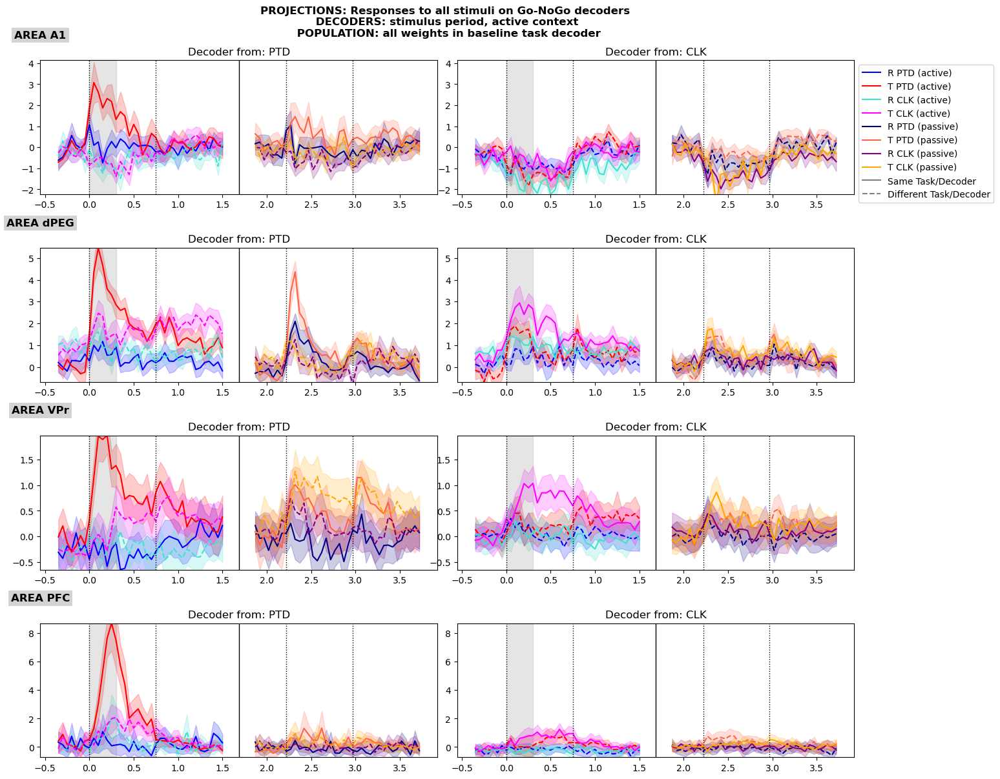

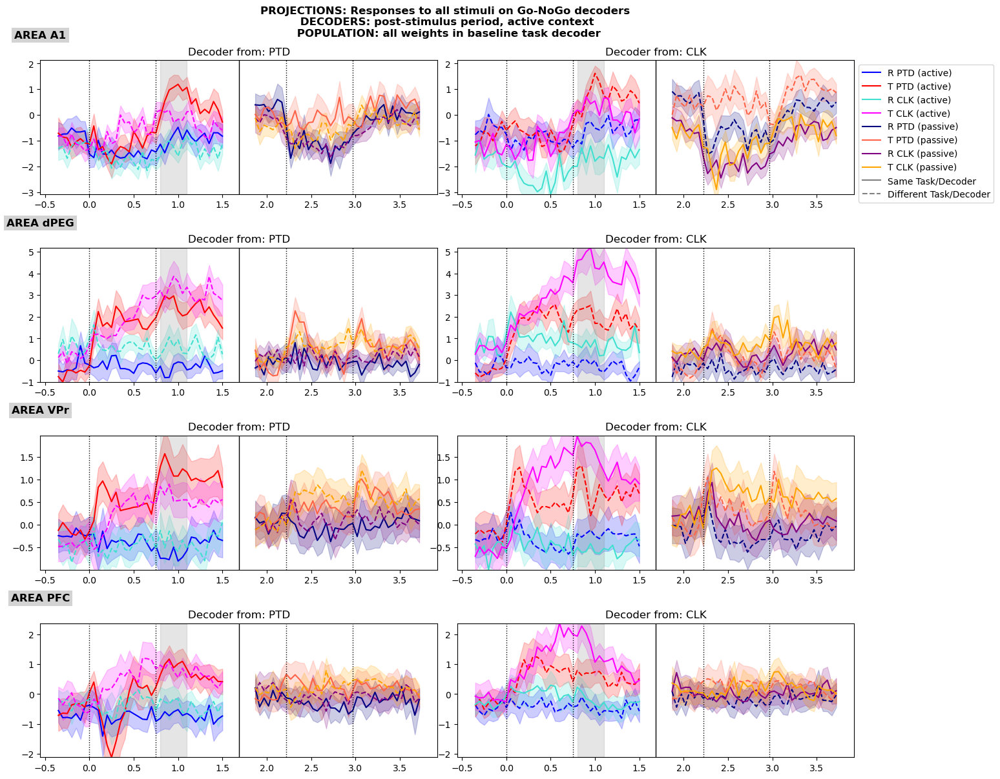

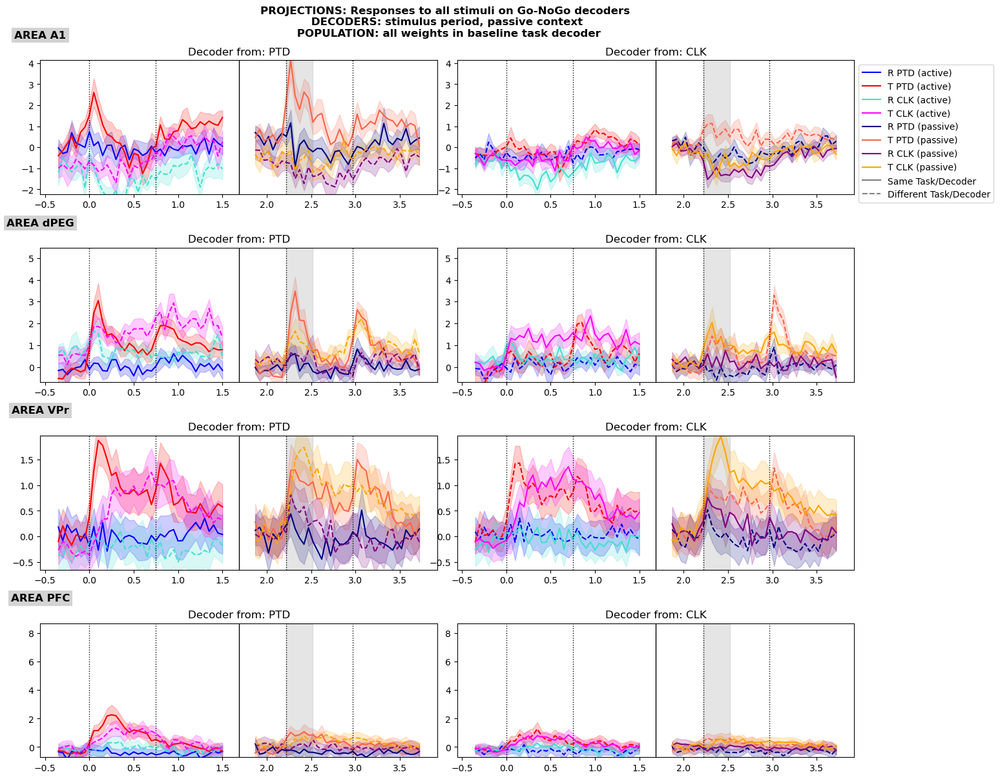

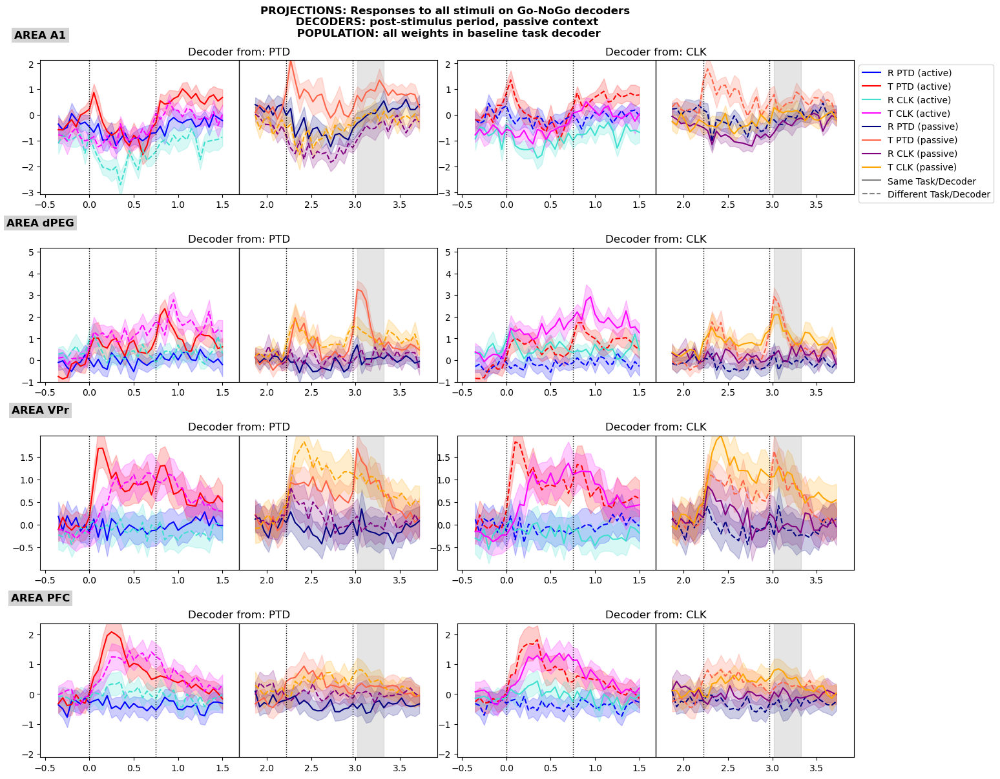

In [20]:
pop = "all"

for ctx_dec in CTXS:
    for wdw in WDWS:
        fig1(pop, ctx_dec, wdw)

## FIG 2: Representation of TORCS stimuli in the Go-NoGo decoders

See `#!!! ... !!!` for the changes compared to FIG1.

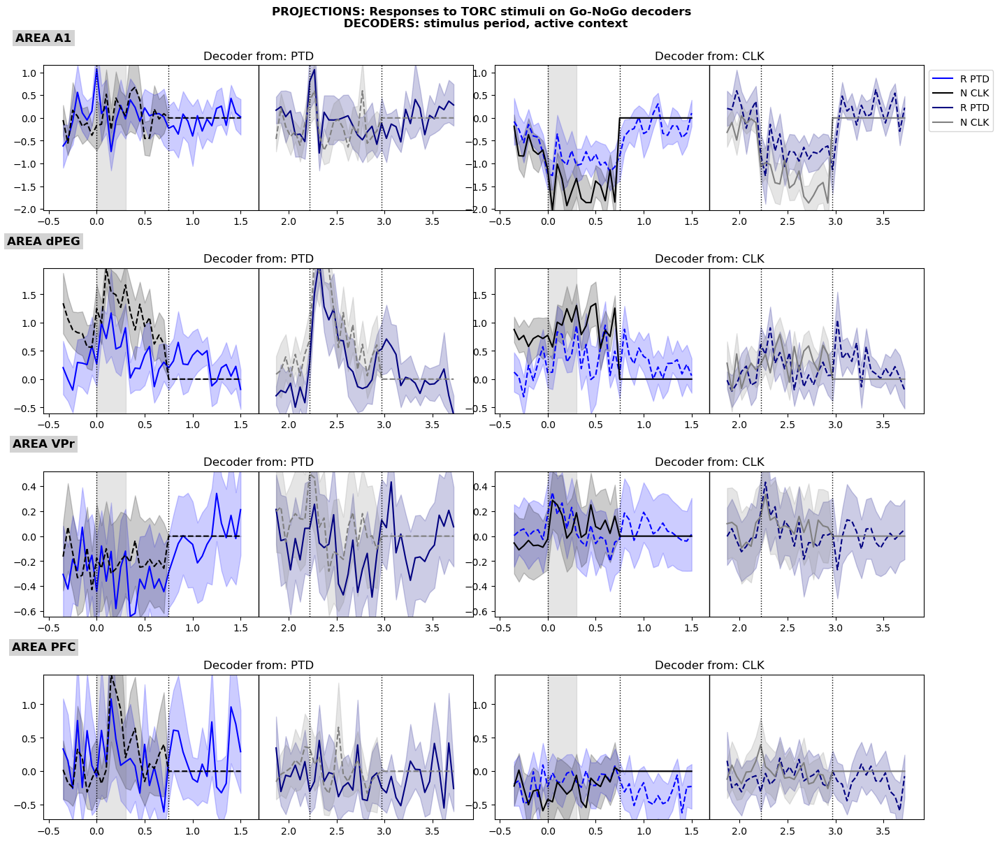

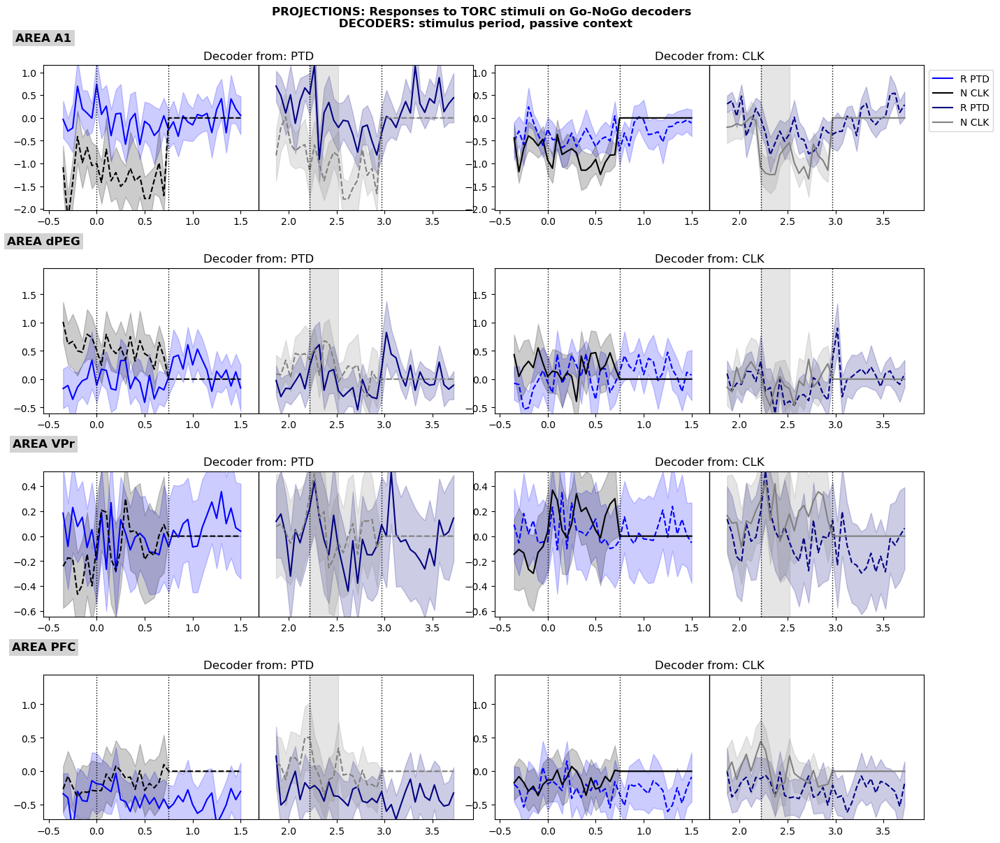

In [14]:
pop = "all"

nrows = len(AREAS)
ncols = len(TASKS)  # 2 decoders, one for each task

scale_cols = 7
scale_rows = 3
figsize = (scale_cols*ncols, scale_rows*nrows) # (width, height)

duration = time_axis[-1] - time_axis[0]
space_between = 0.2 * duration # arbitrary shift to avoid overlap of the two contexts
time_axis_1 = time_axis
time_axis_2 = time_axis + duration + space_between
delimiter = time_axis_1[-1] + space_between/2


# !!! CHANGE THE LEGEND HANDLES !!!
legend_handles_TORCS = []
# only two curves
for context in ['a', 'p']:
    for task in TASKS:
        for stim in TORCSofTASKS[task]:
            label = f"{stim} {task}"
            color = colors[task][context][stim]
            linestyle = linestyles['same']
            legend_handles_TORCS.append(mlines.Line2D([], [], color=color, linestyle=linestyle, label=label)
            )


# Create one figure per decode type (one by context and window)
for ctx_dec in CTXS:
    for wdw in ["stim"]: # !!! ONLY DURING STIMULUS PRESENTATION !!!
        t_bounds = T_BOUNDS[wdw]

        fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=figsize)
        # !!! CHANGE THE TITLE !!!
        fig.suptitle(f"PROJECTIONS: Responses to TORC stimuli on Go-NoGo decoders \n DECODERS: {WDWS_FULL[wdw]} period, {CTXS_FULL[ctx_dec]} context", weight='bold', y=1.02)

        # First pass: determine the global y-axis limits for each row (area) across all activity conditions
        y_min = [np.inf] * nrows
        y_max = [-np.inf] * nrows
        for i, area in enumerate(AREAS): # for each area (row), iterate over the decoders and time courses
            for j, task_dec in enumerate(TASKS): # decoder task
                for k, c in enumerate(CTXS): # activity context
                    for t in TASKS: # activity task
                        for s in TORCSofTASKS[t]: #!!! REPLACE STIMSofTASKS by TORCSofTASKS !!!
                            data = P_avg[pop][area][(task_dec, c, wdw)][(t, c, s)]
                            y_min[i] = min(y_min[i],data.min())
                            y_max[i] = max(y_max[i], data.max())

        # Second pass: plot the data and set the y-axis limits
        for i, area in enumerate(AREAS):  # rows = areas
            for j, task_dec in enumerate(TASKS):  # columns = decoders from each task
                ax = axes[i, j]  # select subplot
                # Plot the activity in both contexts
                for c_idx, (c, current_time_axis) in enumerate(zip(CTXS, [time_axis_1, time_axis_2])):  # c_idx: used to shift the time axis for the second context
                    # Within each context, plot all the stimuli (sweep tasks ans stimuli within this task)
                    for t in TASKS:
                        for s in TORCSofTASKS[t]: #!!! REPLACE by TORCSofTASKS !!!
                            data_to_plot = P_avg[pop][area][(task_dec, ctx_dec, wdw)][(t, c, s)]
                            sem_to_plot = SEM_avg[pop][area][(task_dec, ctx_dec, wdw)][(t, c, s)]
                            ls = '-' if t == task_dec else '--'  # linestyles (dotted if decoder task different from activity task)
                            ax.plot(current_time_axis, data_to_plot, color=colors[t][c][s], ls=ls)
                            ax.fill_between(current_time_axis,
                                            data_to_plot - sem_to_plot,
                                            data_to_plot + sem_to_plot,
                                            color=colors[t][c][s], alpha=0.2)

                    # Mark the start and end of the stimulus presentation
                    for t_to_mark in [t_onset, t_offset]:
                        ax.axvline(c_idx * (duration + space_between) + t_to_mark, color='k', ls=':', lw=1)

                    # Highlight the window when decoders were fitted
                    if ctx_dec == c:
                        t0 = c_idx * (duration + space_between) + t_bounds[0]
                        t1 = c_idx * (duration + space_between) + t_bounds[1]
                        ax.axvspan(t0, t1, color="gray", alpha=0.2)

                # Add a vertical line to separate the contexts
                ax.axvline(delimiter, color='k', lw=1)

                # Set the full plot properties
                ax.set_title(f"Decoder from: {task_dec}")
                ax.set_ylim(y_min[i], y_max[i])

                # !!! CHANGE THE LEGEND HANDLES !!!
                if i == 0 and j == len(TASKS) - 1:
                    ax.legend(handles=legend_handles_TORCS, loc='upper left', bbox_to_anchor=(1, 1))

                # Add the area label above the row of plots
                if j == 0:  # only add one label per row, above the first column
                    ax.text(0, 1.15, f"AREA {area}", transform=ax.transAxes,
                            ha='center', va='bottom', weight='bold', fontsize=12,
                            bbox=dict(facecolor='lightgray', edgecolor='none', pad=3.0))


        plt.subplots_adjust(left=0.05, right=0.95, top=0.95, bottom=0.05, wspace=0.05, hspace=0.4)

        # Save the figure
        fig_name = f"proj_on_{wdw}_{ctx_dec}_TORCS.png" # !!! CHANGE THE NAME !!!
        plt.savefig(f"{path_figures}/{fig_name}", transparent=True, dpi='figure', format='png', bbox_inches=None)

        plt.show()

## FIG 3: Projection for low-weights and high-weights units in the task decoder

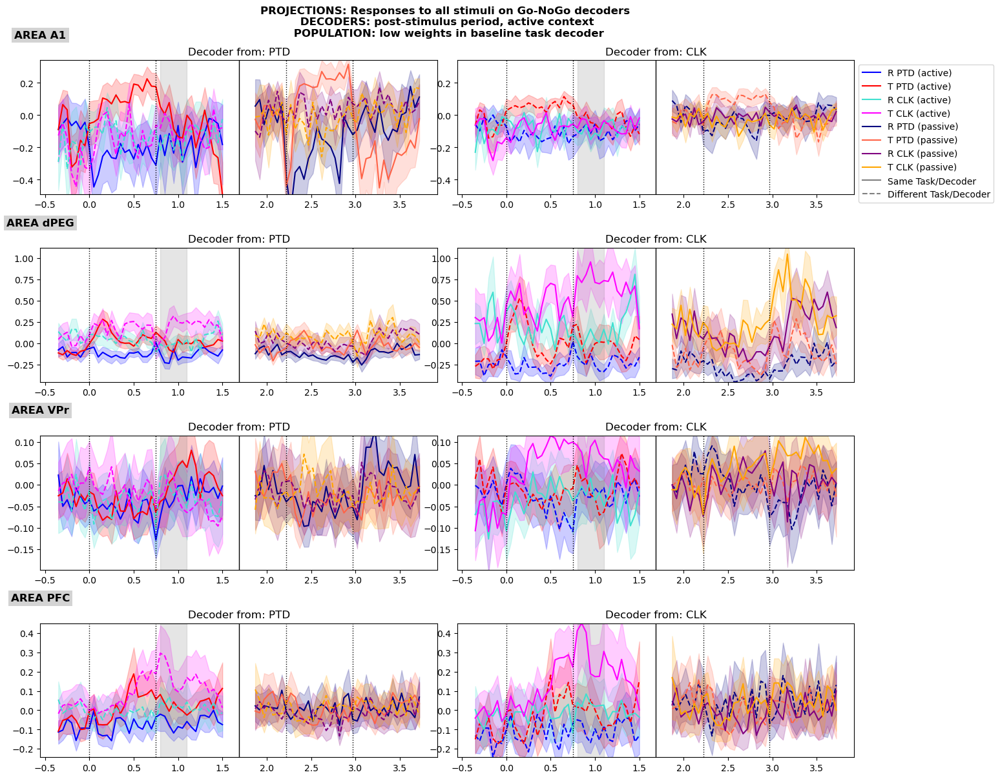

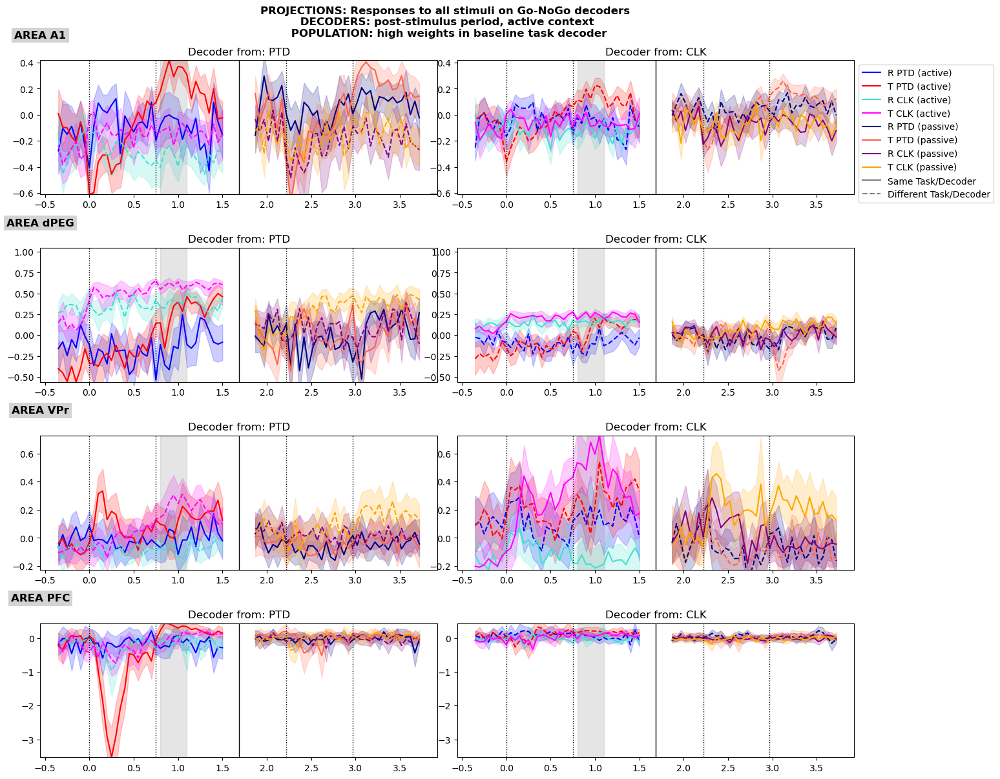

In [21]:
for pop in ["low", "high"]:
    for ctx_dec in ['a']:
        for wdw in ['post']:
            fig1(pop, ctx_dec, wdw)

**Observations**

Population low: 
- Contributes to enhance T-CLK in both Go-NoGo decoders

Population high:
- In PFC, contributes to enhance T-PTD in both Go-NoGo decoders
- In VPr, contributes to a late Go-NoGo discrimination for CLK stimuli
- In dPEG, the early task discrimination is converted to a late Go-NoGo discrimination for PTD stimuli
